The goals / steps of this project are the following:

- Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
- Apply a color transform and append binned color features, as well as histograms of color, to HOG feature vector. 
- Normalize features and randomize a selection for training and testing.
- Implement a sliding-window technique and use trained classifier to search for vehicles in images.
- Run pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
- Estimate a bounding box for vehicles detected.


In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
import os 
from collections import deque
from scipy.ndimage.measurements import label

from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC,SVC
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.externals import joblib

## Collecting data

In [2]:
notcars = glob.glob('./dataset/non-vehicles/*/*.png')
cars = glob.glob('./dataset/vehicles/*/*.png')

## Utils

### Histograms of Color

In [3]:
# color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32):#, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)#, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)#, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)#, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

### Spatial Binning of Color

In [4]:
# binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

### Histogram of Oriented Gradients (HOG)

In [5]:
# HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  block_norm= 'L2-Hys',
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualize=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualize=vis, feature_vector=feature_vec)
        return features

### Extract features

In [6]:
# extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        features.append(single_img_features(image, color_space, spatial_size,
                        hist_bins, orient, 
                        pix_per_cell, cell_per_block, hog_channel,
                        spatial_feat, hist_feat, hog_feat))
    # Return list of feature vectors
    return features

### Slide window

In [7]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

# Define a single function that can extract features using hog sub-sampling and make predictions
def search_strategy(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    bbox_list = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            xbox_left = np.int(xleft*scale)
            ytop_draw = np.int(ytop*scale)
            win_draw = np.int(window*scale)
            bbox_list.append(((int(xbox_left), int(ytop_draw+ystart)),(int(xbox_left+win_draw),int(ytop_draw+win_draw+ystart))))
    return bbox_list
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    bbox_list = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                bbox_list.append(((int(xbox_left), int(ytop_draw+ystart)),(int(xbox_left+win_draw),int(ytop_draw+win_draw+ystart))))
    return bbox_list

# draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

### Heat map

In [36]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def point2bbox(point):
    x,y,w,h = point
    bbox = ((int(x-w/2),int(y-h/2)),(int(x+w/2),int(y+h/2)))
    return bbox

def get_cars(labels):
    # Iterate through all detected cars
    cars_list = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        w, h = (np.max(nonzerox)-np.min(nonzerox),np.max(nonzeroy)-np.min(nonzeroy))
#         if w > 1.8*h:
#             x, y = (np.min(nonzerox)+w/4.,np.min(nonzeroy)+h/2)
#             cars_list.append((x,y,w/2,h))
#             x, y = (np.min(nonzerox)+3.*w/4.,np.min(nonzeroy)+h/2)
#             cars_list.append((x,y,w/2,h))
#         else:
        x, y = (np.min(nonzerox)+w/2.,np.min(nonzeroy)+h/2)
        cars_list.append((x,y,w,h))
            
    # Return the image
    return cars_list

def calculateIoU(candidateBound, groundTruthBound):
    cx1,cy1 = candidateBound[0]
    cx2,cy2 = candidateBound[1]
 
    gx1,gy1 = groundTruthBound[0]
    gx2, gy2 = groundTruthBound[1]
 
    carea = (cx2 - cx1) * (cy2 - cy1) #C的面积
    garea = (gx2 - gx1) * (gy2 - gy1) #G的面积
 
    x1 = max(cx1, gx1)
    y1 = max(cy1, gy1)
    x2 = min(cx2, gx2)
    y2 = min(cy2, gy2)
    w = max(0, x2 - x1)
    h = max(0, y2 - y1)
    area = w * h #C∩G的面积
    try:
        iou = area / (carea + garea - area)
    except:
        return 0
    return iou

## Data preparation

Parameters

In [9]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

### Extracting features

In [10]:
t=time.time()
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract features...')

140.09 Seconds to extract features...


### Label data

In [11]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

### Train test split

In [12]:
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)

### Normalize data

In [13]:
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

In [14]:
print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block',
     hist_bins,'histogram bins, and', spatial_size,'spatial sampling')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations 8 pixels per cell and 2 cells per block 32 histogram bins, and (32, 32) spatial sampling
Feature vector length: 8460


## Training classifier

In [16]:
retrain = True
if not retrain:
    try:
        svc = joblib.load('clf.pkl')
    except:
        print('Cannot load model, please retrain')
        print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
        
else:
    # svc = SVC(kernel='rbf')
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    joblib.dump(svc,'clf.pkl')

5.19 Seconds to train SVC...
Test Accuracy of SVC =  0.9924


## Serch and Classify

In [17]:
test_images = glob.glob('test_images/*.jpg')

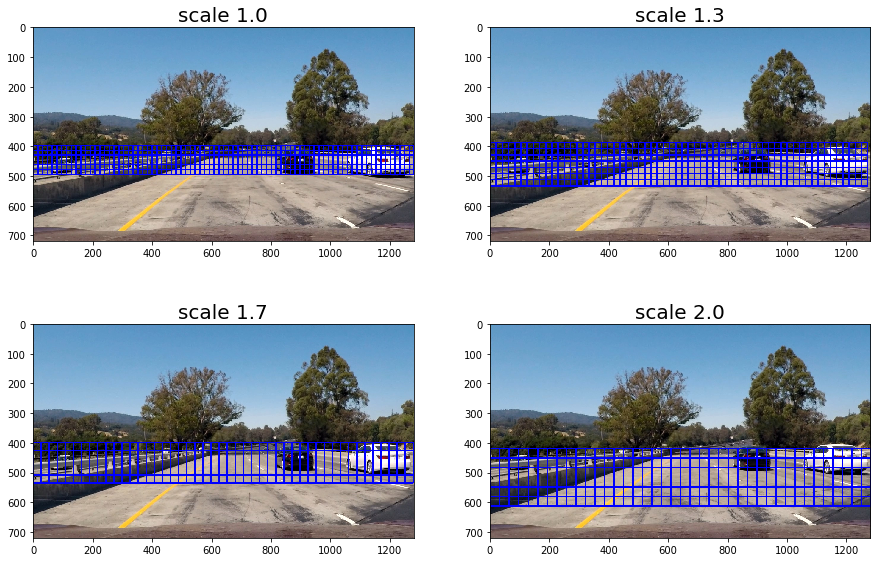

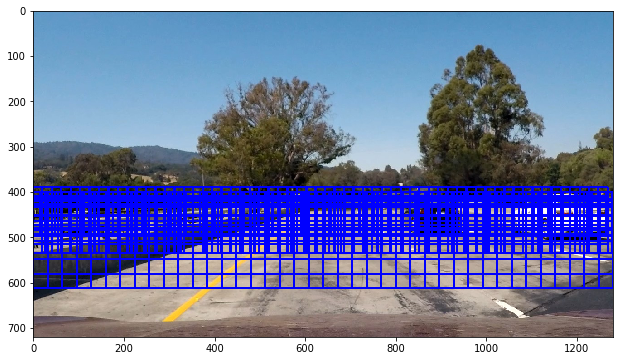

In [18]:
for fname in test_images[:1]:
    image = mpimg.imread(fname)
    sliding_parameters = [[400,500, 1.0],
                         [390, 540, 1.3],
                         [400, 550, 1.7],
                         [420, 620, 2]]
    fig,axes = plt.subplots(2,2,figsize=(15,10))
    axes = axes.ravel()
    bbox_list = []
    for i, sp in enumerate(sliding_parameters):
        draw_image = np.copy(image)
        bboxes = search_strategy(image, sp[0], sp[1], sp[2], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        draw_image = draw_boxes(draw_image, bboxes, color=(0, 0, 255), thick=3)                    
        axes[i].imshow(draw_image)
        axes[i].set_title('scale %.1f'%sp[2],fontsize=20)
#         axes[i].axis('off')
        bbox_list.extend(bboxes)

    draw_image = draw_boxes(draw_image, bbox_list, color=(0, 0, 255), thick=3)                    
    plt.figure(figsize=(15,6))
    plt.imshow(draw_image)
#     plt.axis('off')
    plt.show()

In [19]:
def apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins,vis = False):
    bbox_list = []
    sliding_parameters = [[400,500, 1.0],
                         [390, 540, 1.3],
                         [400, 550, 1.7],
                         [450, 620, 2]]

    for sp in sliding_parameters:
        bboxes = find_cars(image, sp[0], sp[1], sp[2], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        bbox_list.extend(bboxes)

    return bbox_list

0.97 Seconds to process one image


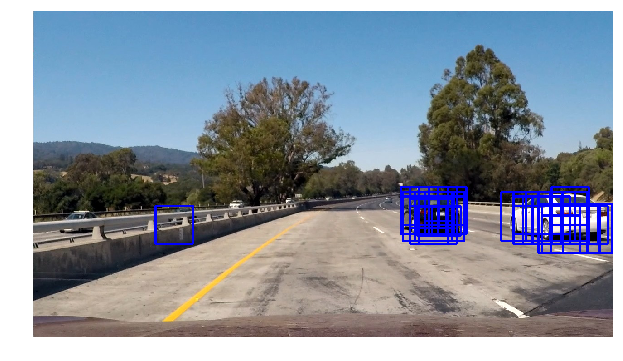

0.97 Seconds to process one image


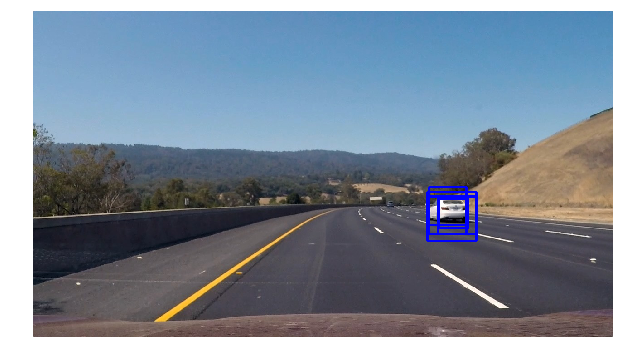

0.95 Seconds to process one image


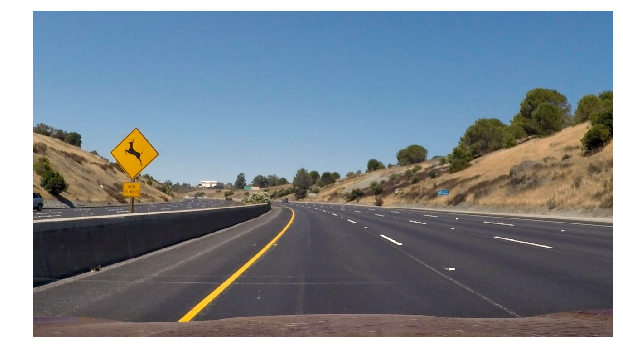

0.98 Seconds to process one image


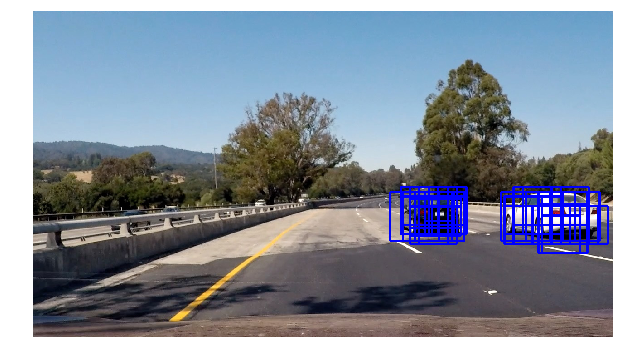

1.04 Seconds to process one image


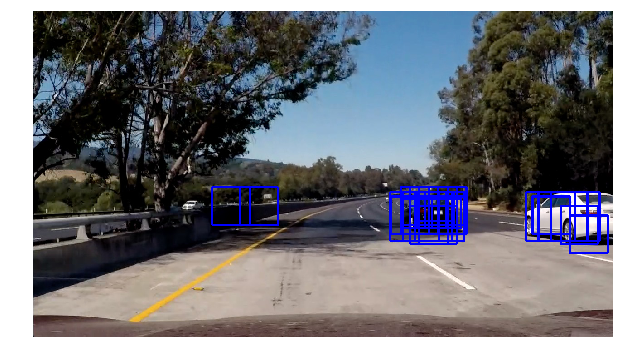

1.0 Seconds to process one image


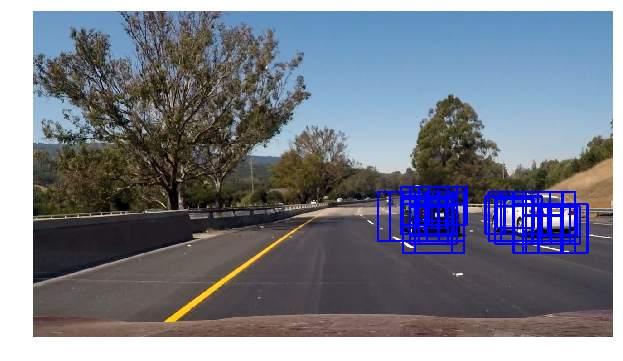

In [20]:
for fname in test_images:
    image = mpimg.imread(fname)
    t1 = time.time()
    bbox_list = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    draw_image = np.copy(image)
    
    draw_image = draw_boxes(draw_image, bbox_list, color=(0, 0, 255), thick=3)                    
    
    plt.figure(figsize=(15,6))
    plt.imshow(draw_image)
    plt.axis('off')
    print(round(time.time()-t1, 2), 'Seconds to process one image')
    plt.show()

## Result

### On test images

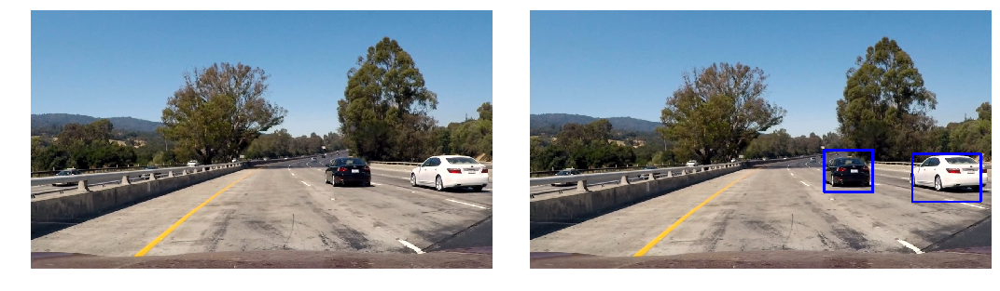

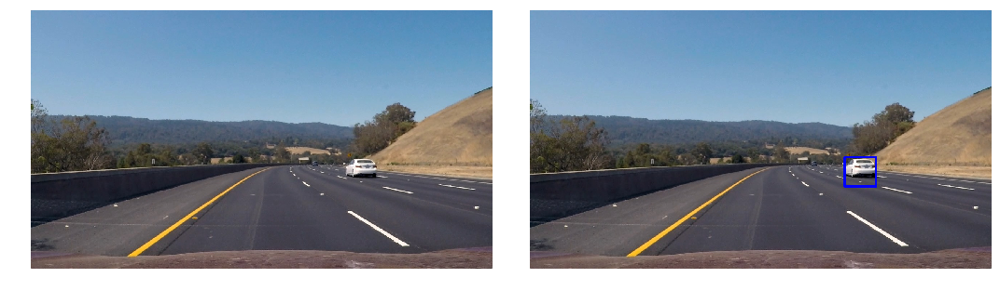

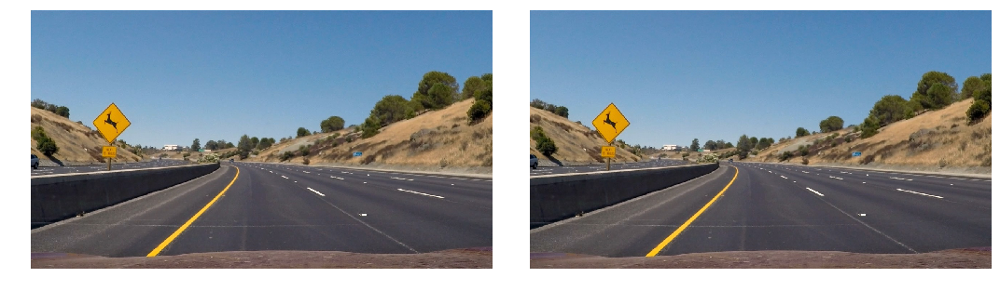

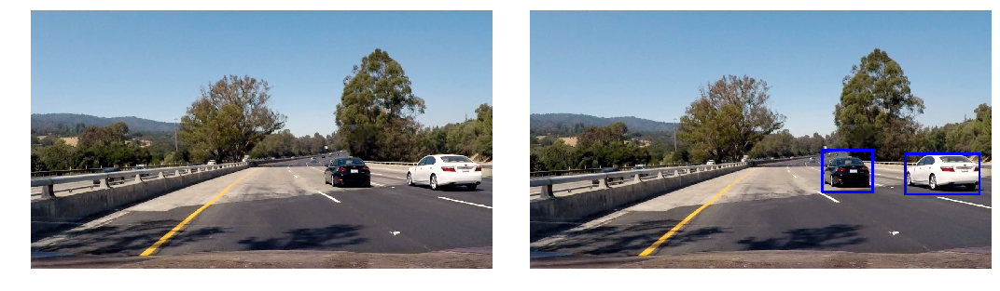

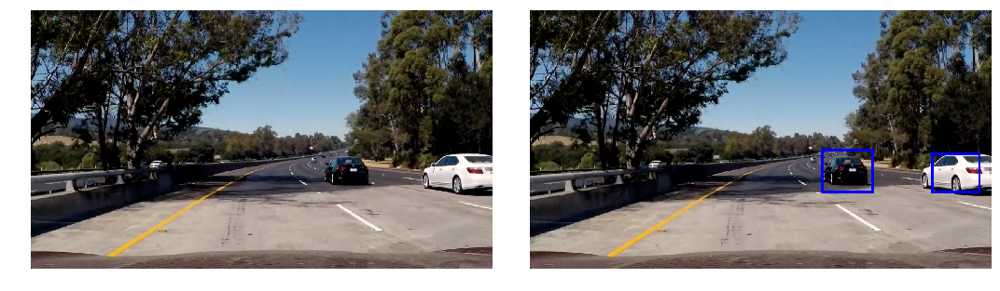

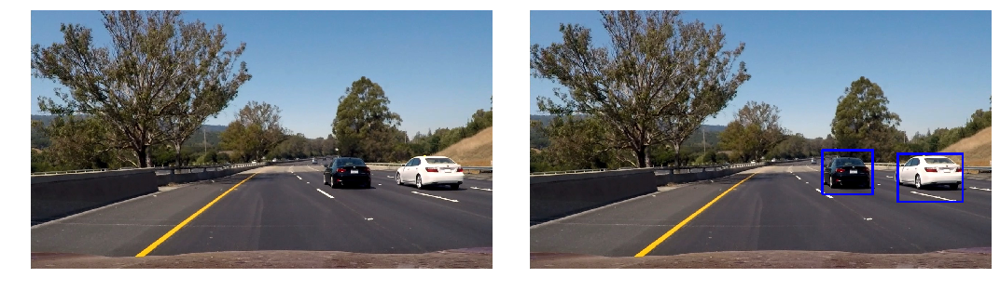

In [21]:
for fname in test_images:
    image = mpimg.imread(fname)
    t1 = time.time()
    bbox_list = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)


    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,bbox_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,2)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    fig = plt.figure(figsize=(15,6))
    plt.subplot(121)
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(draw_img, cmap='hot')
    plt.axis('off')
    fig.tight_layout()
    plt.show()

### On series of  frames of video

In [22]:
series = glob.glob('series/*.jpg')
series = sorted(series)

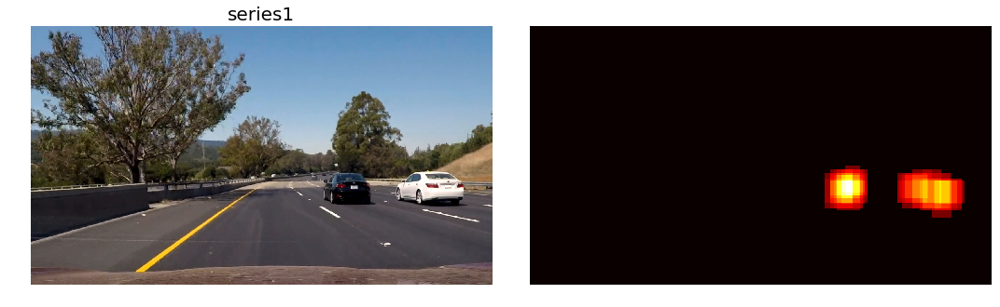

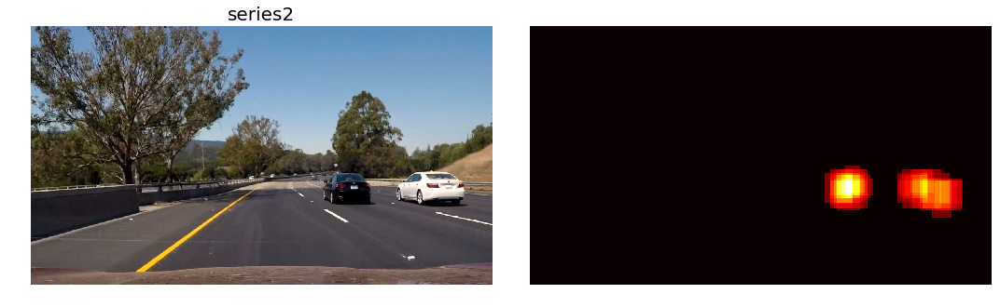

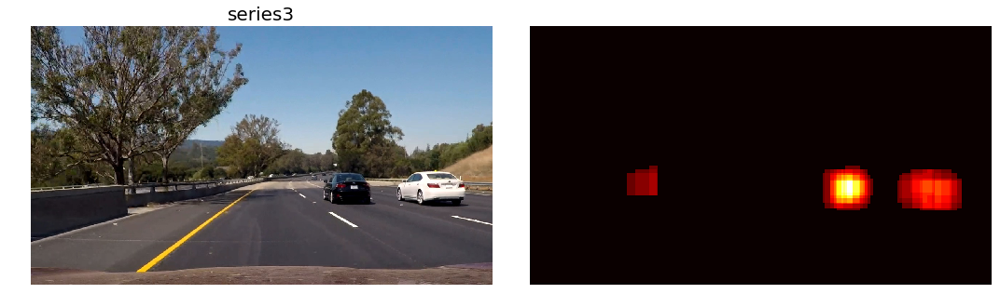

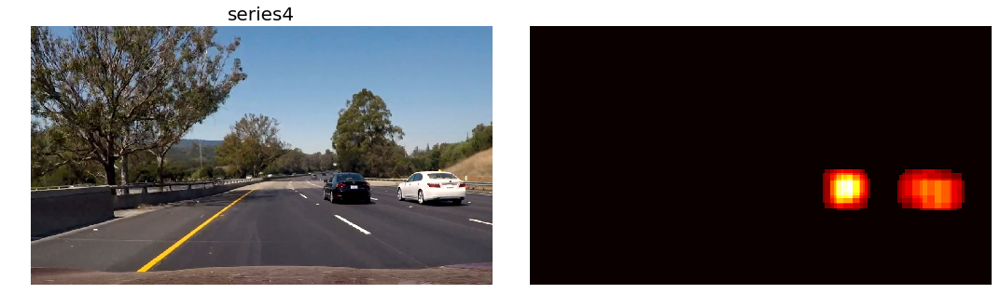

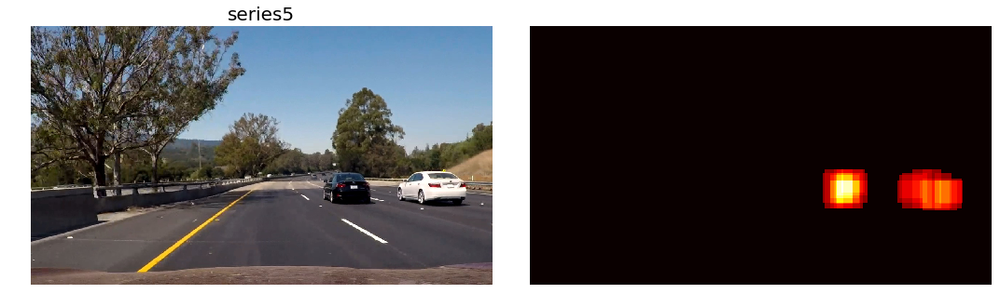

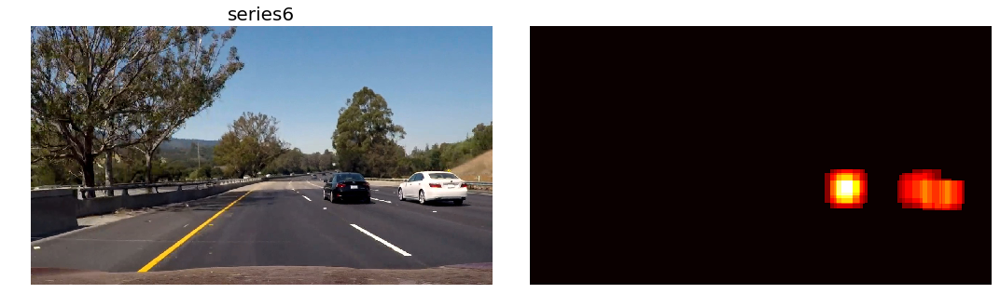

In [23]:
for fname in series:
    image = mpimg.imread(fname)
    t1 = time.time()
    bbox_list = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)


    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,bbox_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,2)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    fig = plt.figure(figsize=(15,6))
    plt.subplot(121)
    plt.imshow(image)
    plt.title(os.path.basename(fname).split('.')[0],fontsize=20)
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(heatmap, cmap='hot')
    plt.axis('off')
    fig.tight_layout()
    plt.show()

#### Before filter

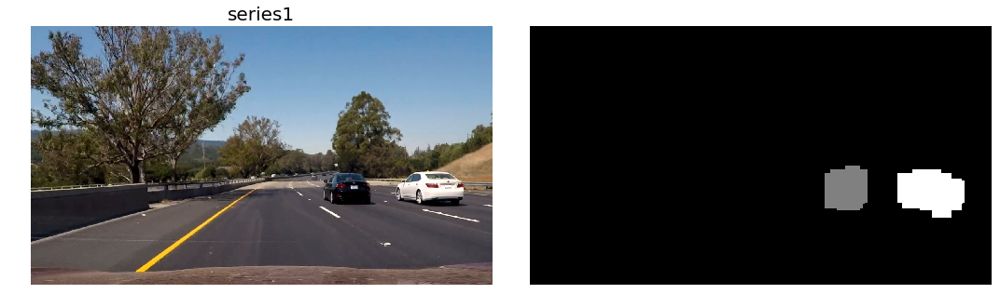

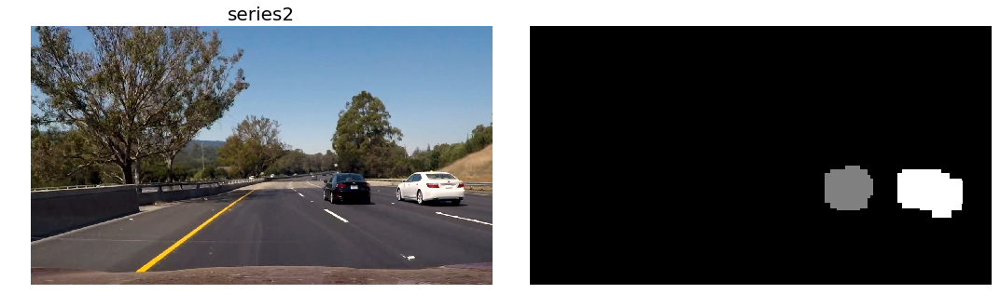

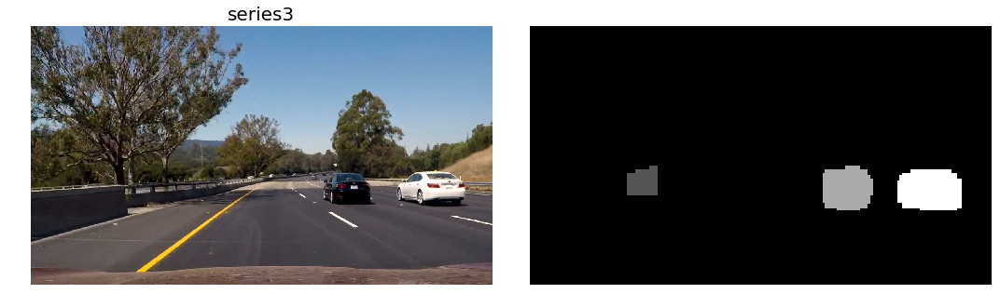

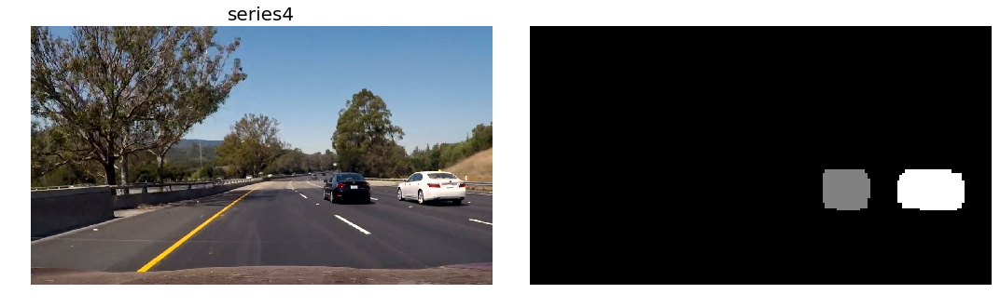

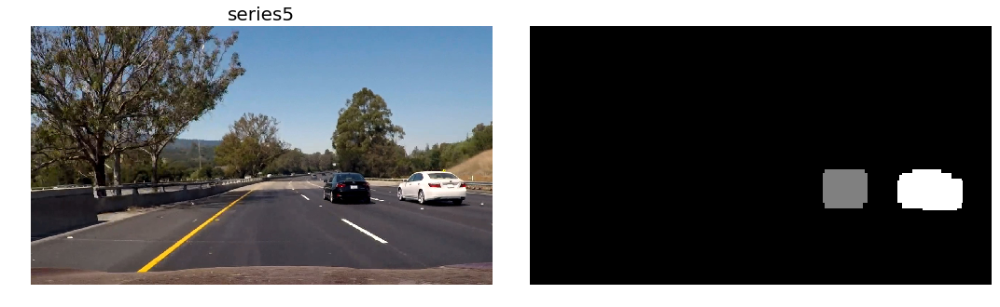

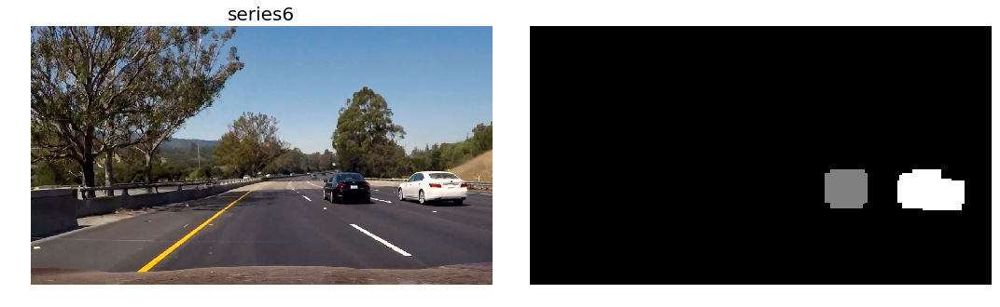

In [24]:
for fname in series:
    image = mpimg.imread(fname)
    t1 = time.time()
    bbox_list = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)


    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,bbox_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,2)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    

    fig = plt.figure(figsize=(15,6))
    plt.subplot(121)
    plt.imshow(image)
    plt.title(os.path.basename(fname).split('.')[0],fontsize=20)
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(labels[0], cmap='gray')
    plt.axis('off')
    fig.tight_layout()
    plt.show()    

#### After filter

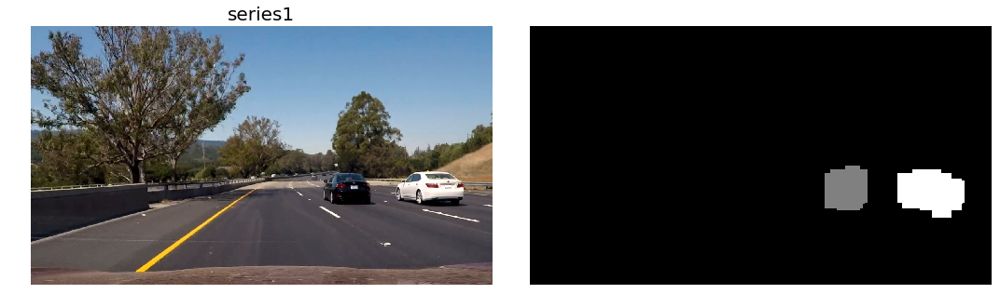

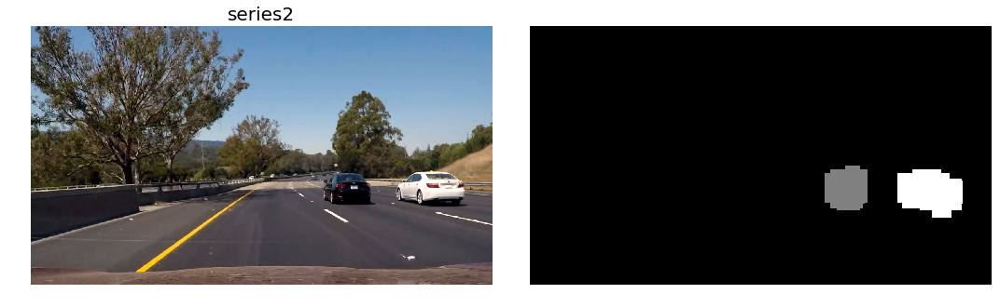

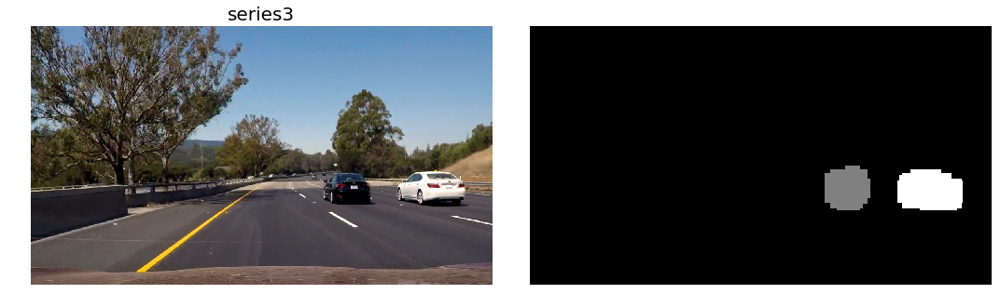

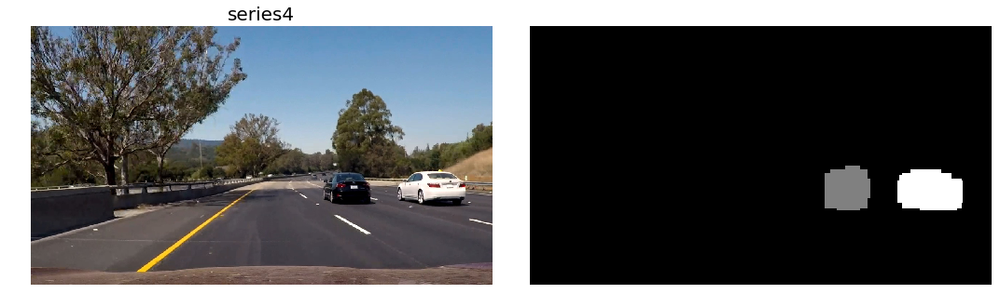

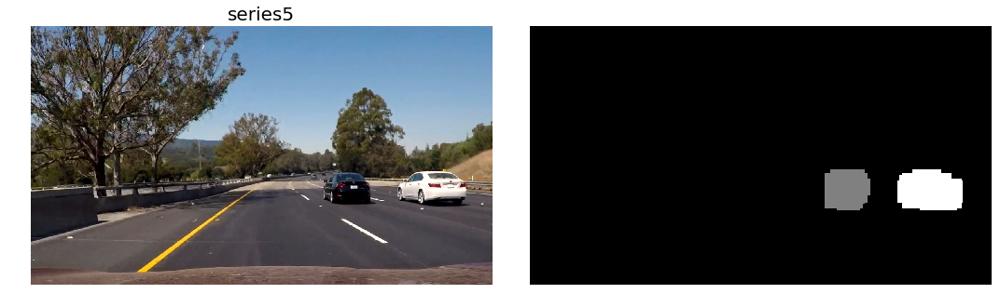

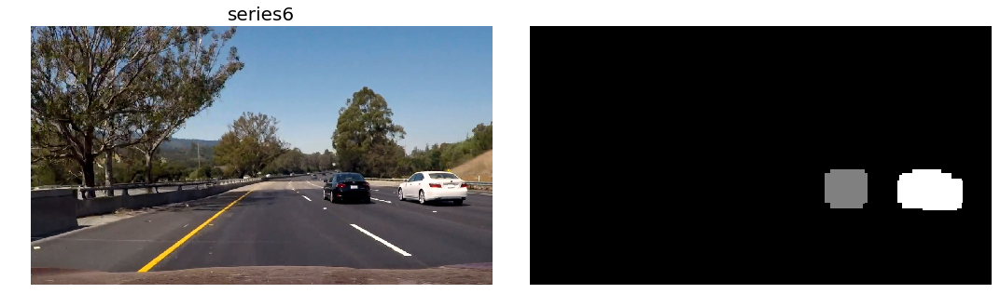

In [25]:
history = deque(maxlen =6)
for fname in series:
    image = mpimg.imread(fname)
    
    bboxes = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, bboxes)

    # Apply threshold to help remove false positives
    threshold = 2
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying    
    current_heatmap = np.clip(heat, 0, 255)
    history.append(current_heatmap)

    heatmap = np.zeros_like(current_heatmap).astype(np.float)
    for heat in history:
        heatmap = heatmap + heat
    threshold = 2*len(history)
    heatmap = apply_threshold(heatmap, threshold)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    fig = plt.figure(figsize=(15,6))
    plt.subplot(121)
    plt.imshow(image)
    plt.title(os.path.basename(fname).split('.')[0],fontsize=20)
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(labels[0], cmap='gray')
    plt.axis('off')
    fig.tight_layout()
    plt.show()   

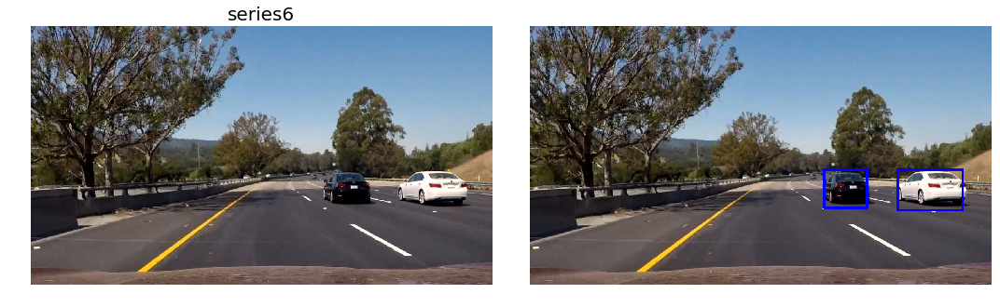

In [26]:
history = deque(maxlen =6)
for fname in series:
    image = mpimg.imread(fname)
    
    bboxes = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, bboxes)

    # Apply threshold to help remove false positives
    threshold = 2
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying    
    current_heatmap = np.clip(heat, 0, 255)
    history.append(current_heatmap)

    heatmap = np.zeros_like(current_heatmap).astype(np.float)
    for heat in history:
        heatmap = heatmap + heat
    threshold = 2*len(history)
    heatmap = apply_threshold(heatmap, threshold)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)
fig = plt.figure(figsize=(15,6))
plt.subplot(121)
plt.imshow(image)
plt.title(os.path.basename(fname).split('.')[0],fontsize=20)
plt.axis('off')
plt.subplot(122)
plt.imshow(draw_img, cmap='gray')
plt.axis('off')
fig.tight_layout()
plt.show()   

## Tracker

In [27]:
class Vehicle():
    def __init__(self,point):
        self.detected = False
        self.n_detections = 0
        self.n_nondetections = 0
        self.recent_xfitted = [point[0]]
        self.bestx = point[0]
        self.recent_yfitted = [point[1]]
        self.besty = point[1]
        self.recent_wfitted = [point[2]]
        self.bestw = point[2]
        self.recent_hfitted = [point[3]]
        self.besth = point[3]
    def getIOU(self,box):
        vehicle_box = point2bbox((self.bestx,self.besty,self.bestw,self.besth))
        return calculateIoU(box, vehicle_box)
    def update(self,point):
        self.recent_xfitted.append(point[0])
        self.recent_yfitted.append(point[1])
        self.recent_wfitted.append(point[2])
        self.recent_hfitted.append(point[3])
        self.bestx = np.mean(self.recent_xfitted[-6:])
        self.besty = np.mean(self.recent_yfitted[-6:])
        self.bestw = np.mean(self.recent_wfitted[-6:])
        self.besth = np.mean(self.recent_hfitted[-6:])
        self.detected = True
        self.n_nondetections=0
        self.n_detections+=1
    def getbbox(self):
        return point2bbox((self.bestx,self.besty,self.bestw,self.besth))
        

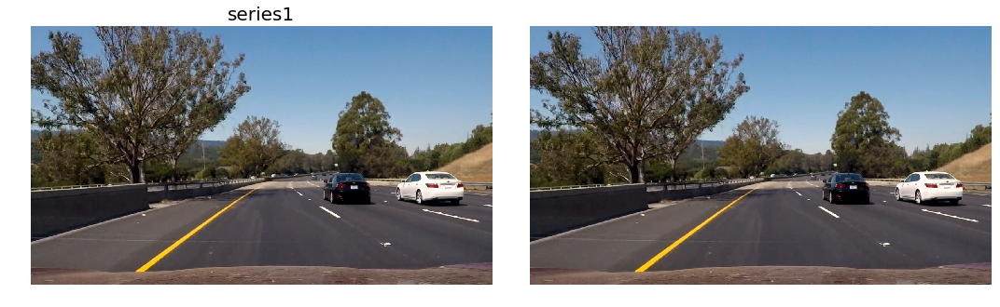

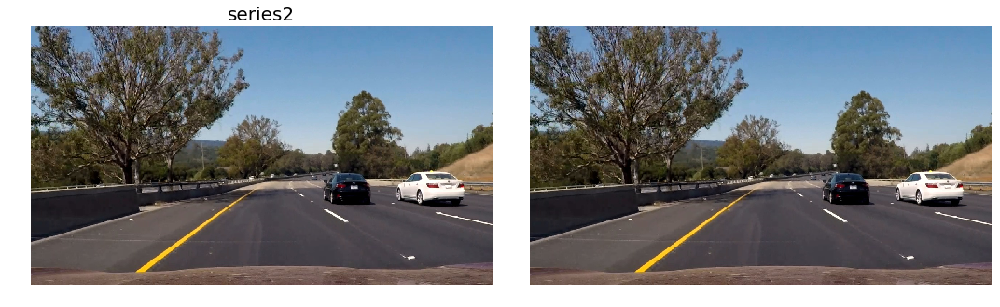

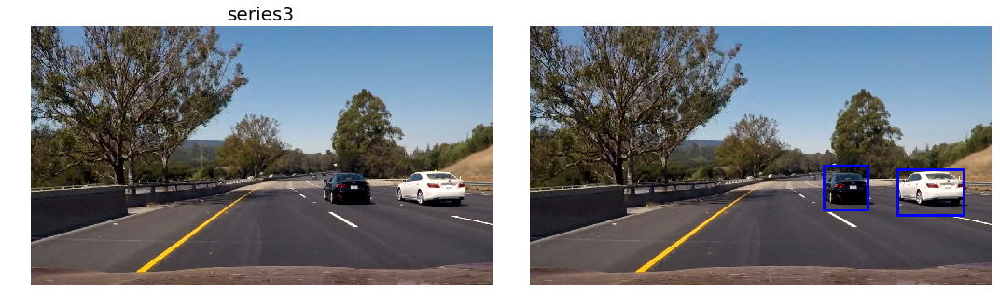

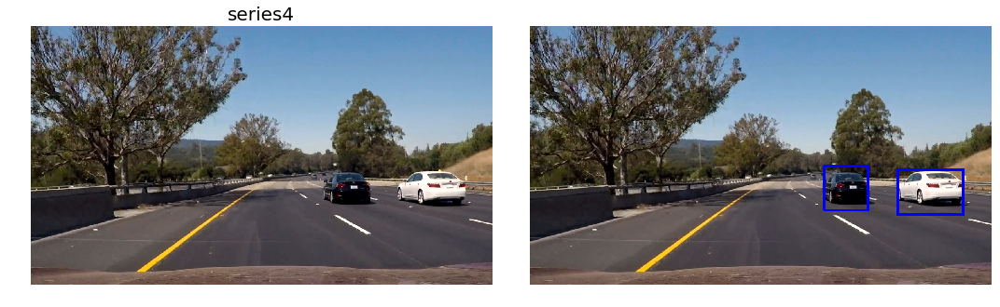

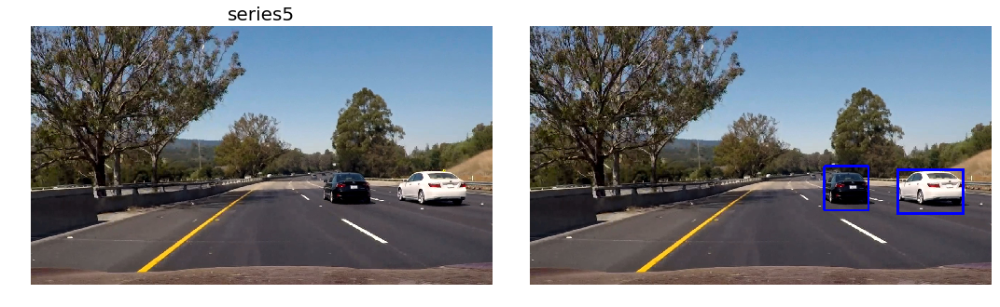

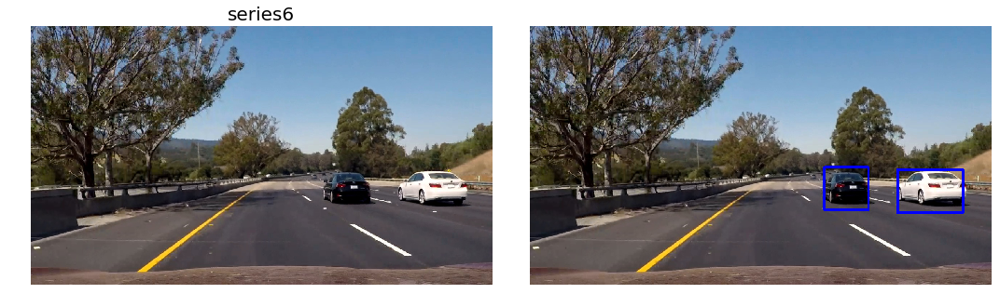

In [28]:
history = deque(maxlen =6)
vehicles = []
for fname in series:
    image = mpimg.imread(fname)
    
    bboxes = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, bboxes)

    # Apply threshold to help remove false positives
    threshold = 2
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying    
    current_heatmap = np.clip(heat, 0, 255)
    history.append(current_heatmap)

    heatmap = np.zeros_like(current_heatmap).astype(np.float)
    for heat in history:
        heatmap = heatmap + heat
    threshold = 2*len(history)
    heatmap = apply_threshold(heatmap, threshold)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)

    points = get_cars(labels)
    # search if detected car is in car list
    for point in points:
        if len(vehicles)!=0:
            found = False
            for vehicle in vehicles:
                bbox = point2bbox(point)
                iou = vehicle.getIOU(bbox)
                if iou>0.5:
                    vehicle.update(point)
                    found = True
                    break
            if not found:
                vehicles.append(Vehicle(point))
        else:
            vehicles.append(Vehicle(point))
    # search if detected car is lose tracking
    for vehicle in vehicles:
        if not vehicle.detected:
            found = False
            for point in points:
                bbox = point2bbox(point)
                if vehicle.getIOU(bbox)>0.5:
                    vehicle.update(point)
                    found = True
            if not found:
                vehicle.n_nondetections+=1
                    
                
    # remove car which lost tracking
    vehicles = [vehicle for vehicle in vehicles if vehicle.n_nondetections<3]
    
    bbox_list = []
    for vehicle in vehicles:
        if vehicle.n_detections>2:
            bbox = vehicle.getbbox()
            bbox_list.append(bbox)
            vehicle.detected = False
    draw_img = draw_boxes(image, bbox_list)

    fig = plt.figure(figsize=(15,6))
    plt.subplot(121)
    plt.imshow(image)
    plt.title(os.path.basename(fname).split('.')[0],fontsize=20)
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(draw_img, cmap='gray')
    plt.axis('off')
    fig.tight_layout()
    plt.show()   

## Pipline

In [37]:
def process_image(image):
    global vehicles
    global history
    bboxes = apply_sliding_window(image, svc, X_scaler, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, bboxes)

    # Apply threshold to help remove false positives
    threshold = 2
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying    
    current_heatmap = np.clip(heat, 0, 255)
    history.append(current_heatmap)

    heatmap = np.zeros_like(current_heatmap).astype(np.float)
    for heat in history:
        heatmap = heatmap + heat
    threshold = 2*len(history)
    heatmap = apply_threshold(heatmap, threshold)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    points = get_cars(labels)
    # search if detected car is in car list
    for point in points:
        if len(vehicles)!=0:
            found = False
            for vehicle in vehicles:
                bbox = point2bbox(point)
                iou = vehicle.getIOU(bbox)
                if iou>0.5:
                    vehicle.update(point)
                    found = True
                    break
            if not found:
                vehicles.append(Vehicle(point))
        else:
            vehicles.append(Vehicle(point))
    # search if detected car is lose tracking
    for vehicle in vehicles:
        if not vehicle.detected:
            found = False
            for point in points:
                bbox = point2bbox(point)
                if vehicle.getIOU(bbox)>0.5:
                    vehicle.update(point)
                    found = True
            if not found:
                vehicle.n_nondetections+=1
                    
                
            
    vehicles = [vehicle for vehicle in vehicles if vehicle.n_nondetections<6]
    
    bbox_list = []
    for vehicle in vehicles:
        if vehicle.n_detections>2:
            bbox = vehicle.getbbox()
            bbox_list.append(bbox)
            vehicle.detected = False
    draw_img = draw_boxes(np.copy(image), bbox_list)
    
    return draw_img

In [31]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import os


In [32]:
history = deque(maxlen =6)
vehicles = []
test_output = 'output_videos/test_video_output.mp4'
if not os.path.exists('output_videos'):
    os.mkdir('output_videos')
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip = VideoFileClip("test_video.mp4")
test_video_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time test_video_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video output_videos/test_video_output.mp4
[MoviePy] Writing video output_videos/test_video_output.mp4


 97%|█████████▋| 38/39 [00:37<00:00,  1.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/test_video_output.mp4 

CPU times: user 37.4 s, sys: 544 ms, total: 38 s
Wall time: 38.4 s


In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_output))

In [38]:
history = deque(maxlen =6)
vehicles = []
project_output = 'output_videos/project_video_output.mp4'
if not os.path.exists('output_videos'):
    os.mkdir('output_videos')
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip = VideoFileClip("project_video.mp4")
project_video_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video output_videos/project_video_output.mp4
[MoviePy] Writing video output_videos/project_video_output.mp4


100%|█████████▉| 1260/1261 [20:48<00:00,  1.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_output.mp4 

CPU times: user 20min 57s, sys: 19.7 s, total: 21min 16s
Wall time: 20min 48s


In [39]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))